In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
nyc = pd.read_csv('https://stepik.org/media/attachments/lesson/363873/nyc.csv.zip', compression='zip')
nyc.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [3]:
%%time
nyc.dtypes

CPU times: user 1.18 ms, sys: 582 µs, total: 1.76 ms
Wall time: 1.46 ms


key                   object
fare_amount          float64
pickup_datetime       object
pickup_longitude     float64
pickup_latitude      float64
dropoff_longitude    float64
dropoff_latitude     float64
passenger_count        int64
dtype: object

In [33]:
def haversine(lat1, long1, lat2, long2, radius=6371):
    lat1, lat2, long1, long2 = [np.deg2rad(x) for x in (lat1, long1, lat2, long2)]
    
    lat_sin = np.sin((lat2 - lat1) / 2) ** 2
    lat_cos = np.cos(lat1) * np.cos(lat2)
    lon_sin = np.sin((long2 - long1) / 2) ** 2
    
    return 2 * radius * np.arcsin(np.sqrt(lat_sin + lat_cos * lon_sin))

In [28]:
r = 6371
haversine(0, 1, 0, 1)

0.0

In [35]:
%%time
r = 6371
dists = []
for index, row in nyc.iterrows():
     dists.append(haversine(row[4], row[3], row[6], row[5]))

CPU times: user 5.24 s, sys: 0 ns, total: 5.24 s
Wall time: 5.24 s


In [36]:
dists

[1.0307639350481281,
 8.450133595805992,
 1.3895252257697308,
 2.799270239983212,
 1.9991567879953052,
 3.7872390847819912,
 1.5558066593500526,
 4.155444291845812,
 1.253231512725298,
 2.849626796108084,
 1.374576999593841,
 0.0,
 0.7177674874531168,
 2.0193838271979137,
 1.671444598074917,
 0.0,
 2.609774493745362,
 1.5119042477204727,
 0.9219517182545394,
 0.39917857039885574,
 1.6868613301690027,
 2.2924697999176953,
 0.9242957326395509,
 1.4039581786018265,
 1.017773088230946,
 2.531946697193182,
 0.0,
 0.3287708526856597,
 4.073463090487827,
 0.808153160788639,
 0.8719132689989956,
 6.703551396163755,
 9.403295658387616,
 1.381588506597531,
 7.150502806160482,
 12.782055688363112,
 0.8066990805204554,
 0.9518008399110727,
 2.3438024765581496,
 3.585990714379401,
 1.6435680593534319,
 5.013935827376097,
 5.7482588406091795,
 5.45687047329047,
 0.9470360672665512,
 2.548615186304444,
 0.9927377363024056,
 0.46185347052173675,
 0.5503272397653778,
 1.6478832232050487,
 2.49931561722

In [34]:
haversine(50, 51, 50, 51)

131.78047419664225

In [53]:
%%time
def haversine(lat1, long1, lat2, long2, radius=6371):
    lat1, lat2, long1, long2 = [np.deg2rad(x) for x in (lat1, lat2, long1, long2)]
    
    lat_sin = np.sin((lat2 - lat1) / 2) ** 2
    lat_cos = np.cos(lat1) * np.cos(lat2)
    lon_sin = np.sin((long2 - long1) / 2) ** 2
    
    return 2 * radius * np.arcsin(np.sqrt(lat_sin + lat_cos * lon_sin))


dists = [ ]
for i, row in nyc.iterrows():
    dists.append(haversine(row[4], row[3], row[6], row[5]))
nyc['distance'] = dists

CPU times: user 4.94 s, sys: 0 ns, total: 4.94 s
Wall time: 4.94 s


In [50]:
nyc.head()

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030764
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450134
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389525
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799270
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999157


In [49]:
for i in nyc.itertuples():
    print(i, '\n')

Pandas(Index=0, key='2009-06-15 17:26:21.0000001', fare_amount=4.5, pickup_datetime='2009-06-15 17:26:21 UTC', pickup_longitude=-73.844311, pickup_latitude=40.721319, dropoff_longitude=-73.84161, dropoff_latitude=40.71227800000001, passenger_count=1, distance=1.0307639350481281) 

Pandas(Index=1, key='2010-01-05 16:52:16.0000002', fare_amount=16.9, pickup_datetime='2010-01-05 16:52:16 UTC', pickup_longitude=-74.016048, pickup_latitude=40.711303, dropoff_longitude=-73.979268, dropoff_latitude=40.782004, passenger_count=1, distance=8.450133595805992) 

Pandas(Index=2, key='2011-08-18 00:35:00.00000049', fare_amount=5.7, pickup_datetime='2011-08-18 00:35:00 UTC', pickup_longitude=-73.982738, pickup_latitude=40.76127, dropoff_longitude=-73.991242, dropoff_latitude=40.750562, passenger_count=2, distance=1.3895252257697308) 

Pandas(Index=3, key='2012-04-21 04:30:42.0000001', fare_amount=7.7, pickup_datetime='2012-04-21 04:30:42 UTC', pickup_longitude=-73.98713000000002, pickup_latitude=40.7

Pandas(Index=912, key='2010-02-22 07:42:00.000000216', fare_amount=6.9, pickup_datetime='2010-02-22 07:42:00 UTC', pickup_longitude=-73.996573, pickup_latitude=40.748843, dropoff_longitude=-73.99517800000002, dropoff_latitude=40.750753, passenger_count=1, distance=0.2427245344220204) 

Pandas(Index=913, key='2014-04-08 14:11:00.00000085', fare_amount=15.0, pickup_datetime='2014-04-08 14:11:00 UTC', pickup_longitude=-73.966193, pickup_latitude=40.758177, dropoff_longitude=-73.991642, dropoff_latitude=40.74908, passenger_count=1, distance=2.3703178679924557) 

Pandas(Index=914, key='2014-06-14 20:48:12.0000002', fare_amount=22.5, pickup_datetime='2014-06-14 20:48:12 UTC', pickup_longitude=-73.991447, pickup_latitude=40.75005, dropoff_longitude=-73.934919, dropoff_latitude=40.769477, passenger_count=2, distance=5.228211444697157) 

Pandas(Index=915, key='2009-06-25 16:21:00.00000040', fare_amount=12.1, pickup_datetime='2009-06-25 16:21:00 UTC', pickup_longitude=-74.007773, pickup_latitude


Pandas(Index=1939, key='2009-08-08 15:17:27.0000002', fare_amount=12.5, pickup_datetime='2009-08-08 15:17:27 UTC', pickup_longitude=-73.999386, pickup_latitude=40.719024, dropoff_longitude=-73.964003, dropoff_latitude=40.760409, passenger_count=1, distance=5.482985840028096) 

Pandas(Index=1940, key='2011-05-09 20:32:00.000000127', fare_amount=23.7, pickup_datetime='2011-05-09 20:32:00 UTC', pickup_longitude=-73.873003, pickup_latitude=40.77401, dropoff_longitude=-73.922568, dropoff_latitude=40.692032, passenger_count=1, distance=10.026685929352475) 

Pandas(Index=1941, key='2012-03-27 17:16:44.0000001', fare_amount=4.9, pickup_datetime='2012-03-27 17:16:44 UTC', pickup_longitude=-73.960642, pickup_latitude=40.772643, dropoff_longitude=-73.967711, dropoff_latitude=40.762714, passenger_count=2, distance=1.2543273006396576) 

Pandas(Index=1942, key='2010-03-26 15:03:00.00000093', fare_amount=9.3, pickup_datetime='2010-03-26 15:03:00 UTC', pickup_longitude=-73.996275, pickup_latitude=40.


Pandas(Index=2737, key='2014-08-13 16:22:59.0000004', fare_amount=14.5, pickup_datetime='2014-08-13 16:22:59 UTC', pickup_longitude=-74.001143, pickup_latitude=40.722796, dropoff_longitude=-73.980361, dropoff_latitude=40.751107, passenger_count=1, distance=3.6022257771125266) 

Pandas(Index=2738, key='2012-03-31 02:49:00.000000136', fare_amount=6.9, pickup_datetime='2012-03-31 02:49:00 UTC', pickup_longitude=-73.999877, pickup_latitude=40.728562, dropoff_longitude=-74.010712, dropoff_latitude=40.708032, passenger_count=2, distance=2.4586904544383663) 

Pandas(Index=2739, key='2013-06-13 09:42:42.0000004', fare_amount=7.0, pickup_datetime='2013-06-13 09:42:42 UTC', pickup_longitude=-74.004661, pickup_latitude=40.730688, dropoff_longitude=-74.013631, dropoff_latitude=40.715568, passenger_count=1, distance=1.8433845426843583) 

Pandas(Index=2740, key='2009-11-07 01:56:00.000000189', fare_amount=9.7, pickup_datetime='2009-11-07 01:56:00 UTC', pickup_longitude=-73.980223, pickup_latitude=4

Pandas(Index=3727, key='2012-09-08 15:06:00.000000187', fare_amount=11.5, pickup_datetime='2012-09-08 15:06:00 UTC', pickup_longitude=-73.950022, pickup_latitude=40.776275, dropoff_longitude=-73.97444499999997, dropoff_latitude=40.753145, passenger_count=2, distance=3.2932659430825817) 

Pandas(Index=3728, key='2013-08-07 17:41:00.00000057', fare_amount=15.5, pickup_datetime='2013-08-07 17:41:00 UTC', pickup_longitude=-73.958675, pickup_latitude=40.762307, dropoff_longitude=-73.999915, dropoff_latitude=40.741292, passenger_count=1, distance=4.186660508909201) 

Pandas(Index=3729, key='2009-04-03 21:48:22.0000003', fare_amount=5.0, pickup_datetime='2009-04-03 21:48:22 UTC', pickup_longitude=-73.975585, pickup_latitude=40.78697, dropoff_longitude=-73.97340200000002, dropoff_latitude=40.797866, passenger_count=1, distance=1.2254380296720424) 

Pandas(Index=3730, key='2009-11-08 09:45:00.0000006', fare_amount=30.8, pickup_datetime='2009-11-08 09:45:00 UTC', pickup_longitude=-73.974547, pic


Pandas(Index=4575, key='2009-11-04 22:23:49.0000004', fare_amount=6.9, pickup_datetime='2009-11-04 22:23:49 UTC', pickup_longitude=-73.99044599999998, pickup_latitude=40.756516, dropoff_longitude=-73.994828, dropoff_latitude=40.750315, passenger_count=2, distance=0.7820991693232683) 

Pandas(Index=4576, key='2011-03-15 23:29:00.00000022', fare_amount=6.5, pickup_datetime='2011-03-15 23:29:00 UTC', pickup_longitude=-73.98947199999998, pickup_latitude=40.735858, dropoff_longitude=-73.968775, dropoff_latitude=40.754508, passenger_count=1, distance=2.7093694380629243) 

Pandas(Index=4577, key='2012-03-09 21:56:02.0000001', fare_amount=14.9, pickup_datetime='2012-03-09 21:56:02 UTC', pickup_longitude=-74.00684100000002, pickup_latitude=40.720006, dropoff_longitude=-73.977631, dropoff_latitude=40.744698, passenger_count=1, distance=3.6872882651645775) 

Pandas(Index=4578, key='2011-02-22 09:20:00.00000021', fare_amount=7.3, pickup_datetime='2011-02-22 09:20:00 UTC', pickup_longitude=-73.963


Pandas(Index=5444, key='2010-05-19 09:18:00.000000125', fare_amount=7.3, pickup_datetime='2010-05-19 09:18:00 UTC', pickup_longitude=-73.991582, pickup_latitude=40.744067, dropoff_longitude=-73.975412, dropoff_latitude=40.754573, passenger_count=3, distance=1.7944716202392845) 

Pandas(Index=5445, key='2010-06-28 08:30:00.00000068', fare_amount=10.5, pickup_datetime='2010-06-28 08:30:00 UTC', pickup_longitude=-73.96056, pickup_latitude=40.797445, dropoff_longitude=-73.985952, dropoff_latitude=40.756643, passenger_count=5, distance=5.015531330429084) 

Pandas(Index=5446, key='2013-04-11 20:25:00.00000095', fare_amount=11.0, pickup_datetime='2013-04-11 20:25:00 UTC', pickup_longitude=-74.00967800000002, pickup_latitude=40.704795, dropoff_longitude=-73.989192, dropoff_latitude=40.730692, passenger_count=1, distance=3.3575388539225126) 

Pandas(Index=5447, key='2013-08-15 06:00:04.0000001', fare_amount=9.5, pickup_datetime='2013-08-15 06:00:04 UTC', pickup_longitude=-73.99319100000002, pi

Pandas(Index=6140, key='2013-12-11 13:58:53.0000001', fare_amount=13.5, pickup_datetime='2013-12-11 13:58:53 UTC', pickup_longitude=-73.974884, pickup_latitude=40.754788, dropoff_longitude=-73.982202, dropoff_latitude=40.774152, passenger_count=1, distance=2.239647757950865) 

Pandas(Index=6141, key='2012-01-21 19:38:22.0000005', fare_amount=8.5, pickup_datetime='2012-01-21 19:38:22 UTC', pickup_longitude=-73.998418, pickup_latitude=40.719953, dropoff_longitude=-73.993868, dropoff_latitude=40.746052, passenger_count=2, distance=2.927289889448395) 

Pandas(Index=6142, key='2013-09-04 19:55:26.0000002', fare_amount=7.0, pickup_datetime='2013-09-04 19:55:26 UTC', pickup_longitude=-73.989997, pickup_latitude=40.729421, dropoff_longitude=-73.983065, dropoff_latitude=40.745582, passenger_count=1, distance=1.8895480343603444) 

Pandas(Index=6143, key='2014-11-23 20:17:00.00000084', fare_amount=29.0, pickup_datetime='2014-11-23 20:17:00 UTC', pickup_longitude=-73.98226, pickup_latitude=40.7318


Pandas(Index=7129, key='2011-04-26 08:21:21.0000005', fare_amount=28.9, pickup_datetime='2011-04-26 08:21:21 UTC', pickup_longitude=-74.005942, pickup_latitude=40.707901, dropoff_longitude=-74.03034, dropoff_latitude=40.634276, passenger_count=1, distance=8.441353923044923) 

Pandas(Index=7130, key='2011-09-07 10:20:30.0000001', fare_amount=7.3, pickup_datetime='2011-09-07 10:20:30 UTC', pickup_longitude=-74.00298000000002, pickup_latitude=40.733625, dropoff_longitude=-74.000277, dropoff_latitude=40.721436, passenger_count=2, distance=1.3743603971976062) 

Pandas(Index=7131, key='2015-04-20 21:06:37.00000014', fare_amount=11.0, pickup_datetime='2015-04-20 21:06:37 UTC', pickup_longitude=-73.99732971191406, pickup_latitude=40.724281311035156, dropoff_longitude=-73.99467468261719, dropoff_latitude=40.75378799438477, passenger_count=2, distance=3.288609936944165) 

Pandas(Index=7132, key='2011-03-20 01:45:14.0000002', fare_amount=5.7, pickup_datetime='2011-03-20 01:45:14 UTC', pickup_lon


Pandas(Index=8158, key='2010-09-30 13:32:00.000000140', fare_amount=8.1, pickup_datetime='2010-09-30 13:32:00 UTC', pickup_longitude=-73.987597, pickup_latitude=40.759565, dropoff_longitude=-73.980215, dropoff_latitude=40.75017, passenger_count=1, distance=1.215720965158838) 

Pandas(Index=8159, key='2012-01-03 12:17:30.0000001', fare_amount=15.7, pickup_datetime='2012-01-03 12:17:30 UTC', pickup_longitude=-74.000339, pickup_latitude=40.727368, dropoff_longitude=-73.956314, dropoff_latitude=40.781605, passenger_count=1, distance=7.079759439584698) 

Pandas(Index=8160, key='2012-06-28 21:44:00.000000162', fare_amount=33.7, pickup_datetime='2012-06-28 21:44:00 UTC', pickup_longitude=-73.78360500000002, pickup_latitude=40.64859000000001, dropoff_longitude=-73.923563, dropoff_latitude=40.745485, passenger_count=2, distance=15.978180719648561) 

Pandas(Index=8161, key='2013-09-13 07:44:34.0000007', fare_amount=6.5, pickup_datetime='2013-09-13 07:44:34 UTC', pickup_longitude=-73.966228, pic


Pandas(Index=9208, key='2012-04-16 23:58:00.00000058', fare_amount=17.3, pickup_datetime='2012-04-16 23:58:00 UTC', pickup_longitude=-73.972258, pickup_latitude=40.781455, dropoff_longitude=-73.972258, dropoff_latitude=40.781455, passenger_count=1, distance=0.0) 

Pandas(Index=9209, key='2010-10-18 07:46:19.0000006', fare_amount=12.1, pickup_datetime='2010-10-18 07:46:19 UTC', pickup_longitude=-73.97421, pickup_latitude=40.791311, dropoff_longitude=-73.940934, dropoff_latitude=40.839788, passenger_count=1, distance=6.074385055455582) 

Pandas(Index=9210, key='2009-02-27 20:57:00.000000182', fare_amount=21.7, pickup_datetime='2009-02-27 20:57:00 UTC', pickup_longitude=-73.862702, pickup_latitude=40.76895800000001, dropoff_longitude=-73.97449300000002, dropoff_latitude=40.757738, passenger_count=1, distance=9.497391377836365) 

Pandas(Index=9211, key='2009-12-24 22:17:00.00000072', fare_amount=4.5, pickup_datetime='2009-12-24 22:17:00 UTC', pickup_longitude=-73.98679200000002, pickup_la

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index=15938, key='2010-05-18 13:59:00.000000169', fare_amount=6.1, pickup_datetime='2010-05-18 13:59:00 UTC', pickup_longitude=-73.9948, pickup_latitude=40.740235, dropoff_longitude=-73.990468, dropoff_latitude=40.755132, passenger_count=1, distance=1.6961924411971423) 

Pandas(Index=15939, key='2011-02-01 22:45:00.000000180', fare_amount=8.5, pickup_datetime='2011-02-01 22:45:00 UTC', pickup_longitude=-73.990847, pickup_latitude=40.718032, dropoff_longitude=-74.013025, dropoff_latitude=40.717092, passenger_count=1, distance=1.8720479706288946) 

Pandas(Index=15940, key='2013-10-09 02:39:00.0000009', fare_amount=4.5, pickup_datetime='2013-10-09 02:39:00 UTC', pickup_longitude=-74.011847, pickup_latitude=40.709552, dropoff_longitude=-74.00407, dropoff_latitude=40.717755, passenger_count=1, distance=1.1232223306898579) 

Pandas(Index=15941, key='2013-10-29 17:25:00.00000031', fare_amount=24.5, pickup_datetime='2013-10-29 17:25:00 UTC', pickup_longitude=-73.950672, pickup_latitude

Pandas(Index=16708, key='2012-10-27 18:11:00.00000090', fare_amount=15.5, pickup_datetime='2012-10-27 18:11:00 UTC', pickup_longitude=-73.97833, pickup_latitude=40.766647, dropoff_longitude=-74.009817, dropoff_latitude=40.74746500000001, passenger_count=1, distance=3.403391998775808) 

Pandas(Index=16709, key='2015-02-09 15:26:43.0000004', fare_amount=6.0, pickup_datetime='2015-02-09 15:26:43 UTC', pickup_longitude=-73.9651107788086, pickup_latitude=40.75539779663085, dropoff_longitude=-73.95418548583984, dropoff_latitude=40.76399993896485, passenger_count=2, distance=1.3272748174636813) 

Pandas(Index=16710, key='2010-12-21 20:31:00.000000107', fare_amount=5.3, pickup_datetime='2010-12-21 20:31:00 UTC', pickup_longitude=-73.97189499999998, pickup_latitude=40.755517, dropoff_longitude=-73.96951, dropoff_latitude=40.765912, passenger_count=1, distance=1.173195913476064) 

Pandas(Index=16711, key='2015-01-03 03:01:05.0000003', fare_amount=33.83, pickup_datetime='2015-01-03 03:01:05 UTC',

Pandas(Index=17644, key='2010-09-18 15:33:00.00000027', fare_amount=49.57, pickup_datetime='2010-09-18 15:33:00 UTC', pickup_longitude=-73.984492, pickup_latitude=40.769898, dropoff_longitude=-73.97545, dropoff_latitude=40.74557, passenger_count=2, distance=2.8103114422757867) 

Pandas(Index=17645, key='2012-08-25 04:43:03.0000001', fare_amount=8.5, pickup_datetime='2012-08-25 04:43:03 UTC', pickup_longitude=0.0, pickup_latitude=0.0, dropoff_longitude=0.0, dropoff_latitude=0.0, passenger_count=1, distance=0.0) 

Pandas(Index=17646, key='2015-04-30 11:00:20.0000005', fare_amount=8.0, pickup_datetime='2015-04-30 11:00:20 UTC', pickup_longitude=-73.98634338378906, pickup_latitude=40.7568473815918, dropoff_longitude=-73.98377227783203, dropoff_latitude=40.74383544921875, passenger_count=1, distance=1.4629812647186702) 

Pandas(Index=17647, key='2012-02-14 23:42:25.0000001', fare_amount=13.3, pickup_datetime='2012-02-14 23:42:25 UTC', pickup_longitude=-73.995209, pickup_latitude=40.739174, 


Pandas(Index=18600, key='2013-05-07 21:23:48.0000002', fare_amount=28.5, pickup_datetime='2013-05-07 21:23:48 UTC', pickup_longitude=-73.98011899999999, pickup_latitude=40.775676, dropoff_longitude=-73.899626, dropoff_latitude=40.859533, passenger_count=3, distance=11.52509052690229) 

Pandas(Index=18601, key='2014-08-02 01:21:27.0000003', fare_amount=9.0, pickup_datetime='2014-08-02 01:21:27 UTC', pickup_longitude=-73.97815600000001, pickup_latitude=40.725234, dropoff_longitude=-74.002429, dropoff_latitude=40.733515, passenger_count=2, distance=2.2430446112005544) 

Pandas(Index=18602, key='2015-06-08 17:26:34.0000003', fare_amount=8.5, pickup_datetime='2015-06-08 17:26:34 UTC', pickup_longitude=-73.99821472167969, pickup_latitude=40.72344207763672, dropoff_longitude=-73.9837188720703, dropoff_latitude=40.730953216552734, passenger_count=5, distance=1.479746340124754) 

Pandas(Index=18603, key='2009-12-25 21:26:23.0000001', fare_amount=4.9, pickup_datetime='2009-12-25 21:26:23 UTC', 


Pandas(Index=19386, key='2009-10-24 02:00:51.0000001', fare_amount=8.5, pickup_datetime='2009-10-24 02:00:51 UTC', pickup_longitude=-73.990426, pickup_latitude=40.73122, dropoff_longitude=-73.99123900000002, dropoff_latitude=40.716513, passenger_count=3, distance=1.6367782926821504) 

Pandas(Index=19387, key='2010-11-12 15:04:00.000000150', fare_amount=4.5, pickup_datetime='2010-11-12 15:04:00 UTC', pickup_longitude=-73.848117, pickup_latitude=40.818272, dropoff_longitude=-73.848117, dropoff_latitude=40.818272, passenger_count=2, distance=0.0) 

Pandas(Index=19388, key='2015-03-22 18:40:25.0000006', fare_amount=13.0, pickup_datetime='2015-03-22 18:40:25 UTC', pickup_longitude=-73.99049377441406, pickup_latitude=40.7558479309082, dropoff_longitude=-73.96017456054686, dropoff_latitude=40.76291275024415, passenger_count=3, distance=2.6717515442149185) 

Pandas(Index=19389, key='2015-04-26 22:10:47.0000004', fare_amount=15.5, pickup_datetime='2015-04-26 22:10:47 UTC', pickup_longitude=-73

Pandas(Index=20357, key='2011-04-09 14:27:08.0000005', fare_amount=28.9, pickup_datetime='2011-04-09 14:27:08 UTC', pickup_longitude=-73.86311500000002, pickup_latitude=40.769086, dropoff_longitude=-73.965475, dropoff_latitude=40.75510300000001, passenger_count=2, distance=8.760059211904556) 

Pandas(Index=20358, key='2011-05-17 09:17:00.00000032', fare_amount=14.9, pickup_datetime='2011-05-17 09:17:00 UTC', pickup_longitude=-73.941523, pickup_latitude=40.791737, dropoff_longitude=-73.972965, dropoff_latitude=40.747658, passenger_count=1, distance=5.570836772708036) 

Pandas(Index=20359, key='2011-10-15 00:20:40.0000004', fare_amount=7.3, pickup_datetime='2011-10-15 00:20:40 UTC', pickup_longitude=-73.991438, pickup_latitude=40.685296, dropoff_longitude=-73.96477800000002, dropoff_latitude=40.68132, passenger_count=4, distance=2.291081383889021) 

Pandas(Index=20360, key='2011-12-06 08:49:00.000000150', fare_amount=6.5, pickup_datetime='2011-12-06 08:49:00 UTC', pickup_longitude=-73.97

Pandas(Index=21381, key='2010-09-11 03:58:00.00000025', fare_amount=12.9, pickup_datetime='2010-09-11 03:58:00 UTC', pickup_longitude=-73.98843000000002, pickup_latitude=40.773955, dropoff_longitude=-73.981858, dropoff_latitude=40.77714, passenger_count=1, distance=0.6570180733099052) 

Pandas(Index=21382, key='2012-01-01 11:29:52.0000001', fare_amount=10.1, pickup_datetime='2012-01-01 11:29:52 UTC', pickup_longitude=-73.98974399999999, pickup_latitude=40.724648, dropoff_longitude=-73.992091, dropoff_latitude=40.754191, passenger_count=1, distance=3.290977536320013) 

Pandas(Index=21383, key='2013-01-03 19:20:28.0000003', fare_amount=14.0, pickup_datetime='2013-01-03 19:20:28 UTC', pickup_longitude=-73.987291, pickup_latitude=40.757222, dropoff_longitude=-74.004132, dropoff_latitude=40.720806, passenger_count=4, distance=4.290668104211763) 

Pandas(Index=21384, key='2013-03-11 00:14:26.0000001', fare_amount=7.5, pickup_datetime='2013-03-11 00:14:26 UTC', pickup_longitude=-73.987338, pi


Pandas(Index=22335, key='2013-02-27 22:41:00.00000032', fare_amount=15.0, pickup_datetime='2013-02-27 22:41:00 UTC', pickup_longitude=-74.01129499999998, pickup_latitude=40.702917, dropoff_longitude=-73.97855799999998, dropoff_latitude=40.684447, passenger_count=1, distance=3.44029745524998) 

Pandas(Index=22336, key='2013-09-04 17:05:00.00000019', fare_amount=7.0, pickup_datetime='2013-09-04 17:05:00 UTC', pickup_longitude=-73.981728, pickup_latitude=40.771225, dropoff_longitude=-73.968272, dropoff_latitude=40.767863, passenger_count=1, distance=1.1932381495415851) 

Pandas(Index=22337, key='2013-11-26 20:36:00.00000037', fare_amount=10.0, pickup_datetime='2013-11-26 20:36:00 UTC', pickup_longitude=-73.972953, pickup_latitude=40.749292, dropoff_longitude=-73.98745799999998, dropoff_latitude=40.721667, passenger_count=1, distance=3.305950733052034) 

Pandas(Index=22338, key='2010-04-22 08:46:42.0000001', fare_amount=14.1, pickup_datetime='2010-04-22 08:46:42 UTC', pickup_longitude=-74

Pandas(Index=23231, key='2009-01-31 13:28:48.0000001', fare_amount=11.7, pickup_datetime='2009-01-31 13:28:48 UTC', pickup_longitude=-74.003197, pickup_latitude=40.738814, dropoff_longitude=-74.00395400000002, dropoff_latitude=40.705582, passenger_count=1, distance=3.6957804332181285) 

Pandas(Index=23232, key='2009-04-06 10:35:00.000000177', fare_amount=8.5, pickup_datetime='2009-04-06 10:35:00 UTC', pickup_longitude=-73.99520799999998, pickup_latitude=40.724988, dropoff_longitude=-73.972988, dropoff_latitude=40.746042, passenger_count=5, distance=2.997620955831717) 

Pandas(Index=23233, key='2010-05-14 19:14:21.0000003', fare_amount=5.3, pickup_datetime='2010-05-14 19:14:21 UTC', pickup_longitude=-73.983272, pickup_latitude=40.738704, dropoff_longitude=-73.983272, dropoff_latitude=40.738704, passenger_count=1, distance=0.0) 

Pandas(Index=23234, key='2012-09-07 19:51:50.0000005', fare_amount=22.0, pickup_datetime='2012-09-07 19:51:50 UTC', pickup_longitude=-74.008374, pickup_latitude


Pandas(Index=24288, key='2011-01-18 19:55:31.0000002', fare_amount=5.7, pickup_datetime='2011-01-18 19:55:31 UTC', pickup_longitude=-73.984258, pickup_latitude=40.748756, dropoff_longitude=-73.975278, dropoff_latitude=40.747646, passenger_count=1, distance=0.7664751801391136) 

Pandas(Index=24289, key='2015-02-06 12:50:49.0000006', fare_amount=15.0, pickup_datetime='2015-02-06 12:50:49 UTC', pickup_longitude=-73.97418212890625, pickup_latitude=40.75624084472656, dropoff_longitude=-73.99240112304686, dropoff_latitude=40.73054885864258, passenger_count=1, distance=3.243030439948223) 

Pandas(Index=24290, key='2009-05-30 01:44:02.0000003', fare_amount=13.3, pickup_datetime='2009-05-30 01:44:02 UTC', pickup_longitude=-74.001959, pickup_latitude=40.736405, dropoff_longitude=-73.953586, dropoff_latitude=40.70765, passenger_count=3, distance=5.180879775883311) 

Pandas(Index=24291, key='2010-04-20 06:03:18.0000001', fare_amount=4.1, pickup_datetime='2010-04-20 06:03:18 UTC', pickup_longitude

Pandas(Index=25333, key='2012-03-09 14:47:42.0000002', fare_amount=45.0, pickup_datetime='2012-03-09 14:47:42 UTC', pickup_longitude=-74.006408, pickup_latitude=40.716998, dropoff_longitude=-73.80725100000002, dropoff_latitude=40.65799000000001, passenger_count=1, distance=18.028600757067764) 

Pandas(Index=25334, key='2012-03-08 09:12:27.0000004', fare_amount=13.3, pickup_datetime='2012-03-08 09:12:27 UTC', pickup_longitude=-73.95435400000002, pickup_latitude=40.787102, dropoff_longitude=-73.985158, dropoff_latitude=40.758442, passenger_count=1, distance=4.109089510559219) 

Pandas(Index=25335, key='2012-06-04 17:12:00.000000175', fare_amount=6.5, pickup_datetime='2012-06-04 17:12:00 UTC', pickup_longitude=-73.976892, pickup_latitude=40.74354500000001, dropoff_longitude=-73.983265, dropoff_latitude=40.725107, passenger_count=6, distance=2.1193649328401203) 

Pandas(Index=25336, key='2012-10-16 04:53:08.0000002', fare_amount=21.5, pickup_datetime='2012-10-16 04:53:08 UTC', pickup_longi

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index=32995, key='2015-02-28 14:25:08.0000002', fare_amount=8.0, pickup_datetime='2015-02-28 14:25:08 UTC', pickup_longitude=-73.98936462402342, pickup_latitude=40.74148559570313, dropoff_longitude=-74.00936126708984, dropoff_latitude=40.73817443847656, passenger_count=1, distance=1.724485195986098) 

Pandas(Index=32996, key='2012-02-06 18:51:47.0000002', fare_amount=4.9, pickup_datetime='2012-02-06 18:51:47 UTC', pickup_longitude=-73.987936, pickup_latitude=40.749619, dropoff_longitude=-73.998424, dropoff_latitude=40.75576, passenger_count=1, distance=1.1165832577999655) 

Pandas(Index=32997, key='2012-10-18 20:47:00.000000228', fare_amount=8.0, pickup_datetime='2012-10-18 20:47:00 UTC', pickup_longitude=-73.989285, pickup_latitude=40.718997, dropoff_longitude=-73.99900500000003, dropoff_latitude=40.734482, passenger_count=2, distance=1.9067409363358514) 

Pandas(Index=32998, key='2013-01-12 10:24:56.0000002', fare_amount=9.0, pickup_datetime='2013-01-12 10:24:56 UTC', pickup_

Pandas(Index=34046, key='2012-08-20 13:12:34.0000002', fare_amount=6.5, pickup_datetime='2012-08-20 13:12:34 UTC', pickup_longitude=-73.98185600000002, pickup_latitude=40.724612, dropoff_longitude=-74.001339, dropoff_latitude=40.722512, passenger_count=1, distance=1.6583713931806072) 

Pandas(Index=34047, key='2014-09-27 14:19:15.0000001', fare_amount=21.0, pickup_datetime='2014-09-27 14:19:15 UTC', pickup_longitude=-73.987852, pickup_latitude=40.716312, dropoff_longitude=-73.984864, dropoff_latitude=40.754217, passenger_count=2, distance=4.222355857018978) 

Pandas(Index=34048, key='2009-12-07 20:07:00.00000059', fare_amount=4.9, pickup_datetime='2009-12-07 20:07:00 UTC', pickup_longitude=-73.94621500000002, pickup_latitude=40.747867, dropoff_longitude=-73.93871800000002, dropoff_latitude=40.752718, passenger_count=1, distance=0.8305318435768332) 

Pandas(Index=34049, key='2010-04-03 02:05:00.0000005', fare_amount=6.9, pickup_datetime='2010-04-03 02:05:00 UTC', pickup_longitude=-73.97

Pandas(Index=34998, key='2014-10-11 17:00:00.00000044', fare_amount=57.33, pickup_datetime='2014-10-11 17:00:00 UTC', pickup_longitude=-73.78452, pickup_latitude=40.64858, dropoff_longitude=-73.97919, dropoff_latitude=40.76088, passenger_count=1, distance=20.62052756875135) 

Pandas(Index=34999, key='2009-03-18 20:49:15.0000003', fare_amount=13.4, pickup_datetime='2009-03-18 20:49:15 UTC', pickup_longitude=0.0, pickup_latitude=0.0, dropoff_longitude=0.0, dropoff_latitude=0.0, passenger_count=1, distance=0.0) 

Pandas(Index=35000, key='2012-03-23 10:52:00.000000137', fare_amount=6.1, pickup_datetime='2012-03-23 10:52:00 UTC', pickup_longitude=-73.985487, pickup_latitude=40.759075, dropoff_longitude=-73.999832, dropoff_latitude=40.75887, passenger_count=1, distance=1.2084371994777061) 

Pandas(Index=35001, key='2011-04-26 17:56:00.00000034', fare_amount=4.9, pickup_datetime='2011-04-26 17:56:00 UTC', pickup_longitude=-73.99091, pickup_latitude=40.739843, dropoff_longitude=-73.998283, dro

Pandas(Index=35823, key='2013-02-17 01:39:47.0000001', fare_amount=7.0, pickup_datetime='2013-02-17 01:39:47 UTC', pickup_longitude=-73.967926, pickup_latitude=40.756275, dropoff_longitude=-73.955848, dropoff_latitude=40.772043, passenger_count=3, distance=2.027026743673862) 

Pandas(Index=35824, key='2009-02-12 19:39:00.00000076', fare_amount=24.5, pickup_datetime='2009-02-12 19:39:00 UTC', pickup_longitude=-74.00814, pickup_latitude=40.711965, dropoff_longitude=-73.95496999999997, dropoff_latitude=40.612053, passenger_count=1, distance=11.980785568266818) 

Pandas(Index=35825, key='2010-04-10 09:42:00.000000139', fare_amount=8.1, pickup_datetime='2010-04-10 09:42:00 UTC', pickup_longitude=-74.009538, pickup_latitude=40.715582, dropoff_longitude=-74.012725, dropoff_latitude=40.70242800000001, passenger_count=2, distance=1.48712160956224) 

Pandas(Index=35826, key='2011-08-04 12:28:00.00000057', fare_amount=7.3, pickup_datetime='2011-08-04 12:28:00 UTC', pickup_longitude=-73.978825, pi

Pandas(Index=36710, key='2015-03-05 16:31:29.0000001', fare_amount=7.5, pickup_datetime='2015-03-05 16:31:29 UTC', pickup_longitude=-73.97840118408203, pickup_latitude=40.75201416015625, dropoff_longitude=-73.9907455444336, dropoff_latitude=40.75873947143555, passenger_count=1, distance=1.2807663261411908) 

Pandas(Index=36711, key='2010-04-01 11:34:47.0000002', fare_amount=9.3, pickup_datetime='2010-04-01 11:34:47 UTC', pickup_longitude=-73.991219, pickup_latitude=40.749569, dropoff_longitude=-73.974393, dropoff_latitude=40.751236, passenger_count=1, distance=1.4294389444353426) 

Pandas(Index=36712, key='2011-09-30 07:37:46.0000004', fare_amount=8.1, pickup_datetime='2011-09-30 07:37:46 UTC', pickup_longitude=-73.961985, pickup_latitude=40.763852, dropoff_longitude=-73.98344499999997, dropoff_latitude=40.743864, passenger_count=1, distance=2.864841240652825) 

Pandas(Index=36713, key='2010-04-17 01:14:00.000000165', fare_amount=3.7, pickup_datetime='2010-04-17 01:14:00 UTC', pickup_l

Pandas(Index=37519, key='2013-06-25 12:50:38.0000002', fare_amount=11.0, pickup_datetime='2013-06-25 12:50:38 UTC', pickup_longitude=-73.990034, pickup_latitude=40.719569, dropoff_longitude=-74.008284, dropoff_latitude=40.719276, passenger_count=1, distance=1.538383984151014) 

Pandas(Index=37520, key='2010-12-04 17:49:00.00000034', fare_amount=14.9, pickup_datetime='2010-12-04 17:49:00 UTC', pickup_longitude=-73.97640799999998, pickup_latitude=40.791128, dropoff_longitude=-73.97189300000002, dropoff_latitude=40.759612, passenger_count=6, distance=3.5249817807649295) 

Pandas(Index=37521, key='2011-04-11 21:04:07.0000001', fare_amount=5.7, pickup_datetime='2011-04-11 21:04:07 UTC', pickup_longitude=-73.98103499999998, pickup_latitude=40.760485, dropoff_longitude=-73.991386, dropoff_latitude=40.749841, passenger_count=2, distance=1.4700254170812097) 

Pandas(Index=37522, key='2013-08-16 10:08:00.000000189', fare_amount=14.0, pickup_datetime='2013-08-16 10:08:00 UTC', pickup_longitude=-7

Pandas(Index=38337, key='2009-09-30 00:13:01.0000002', fare_amount=9.3, pickup_datetime='2009-09-30 00:13:01 UTC', pickup_longitude=-74.00224, pickup_latitude=40.72821, dropoff_longitude=-73.979253, dropoff_latitude=40.762016, passenger_count=2, distance=4.228540973579548) 

Pandas(Index=38338, key='2010-11-30 05:45:31.0000004', fare_amount=45.0, pickup_datetime='2010-11-30 05:45:31 UTC', pickup_longitude=-73.981402, pickup_latitude=40.749934, dropoff_longitude=-73.79021, dropoff_latitude=40.64677, passenger_count=1, distance=19.783355707822416) 

Pandas(Index=38339, key='2012-05-20 09:20:56.0000002', fare_amount=5.7, pickup_datetime='2012-05-20 09:20:56 UTC', pickup_longitude=-74.001693, pickup_latitude=40.722112, dropoff_longitude=-73.991853, dropoff_latitude=40.736843, passenger_count=1, distance=1.8359131859691595) 

Pandas(Index=38340, key='2009-04-02 14:27:05.0000001', fare_amount=3.7, pickup_datetime='2009-04-02 14:27:05 UTC', pickup_longitude=-73.98893299999997, pickup_latitude


Pandas(Index=39025, key='2012-08-11 10:56:07.0000002', fare_amount=4.9, pickup_datetime='2012-08-11 10:56:07 UTC', pickup_longitude=-73.957966, pickup_latitude=40.716095, dropoff_longitude=-73.963898, dropoff_latitude=40.707663, passenger_count=1, distance=1.0625761450405666) 

Pandas(Index=39026, key='2013-08-07 23:52:00.00000027', fare_amount=5.0, pickup_datetime='2013-08-07 23:52:00 UTC', pickup_longitude=-73.98350500000002, pickup_latitude=40.771112, dropoff_longitude=-73.98917, dropoff_latitude=40.776922, passenger_count=2, distance=0.8030758535825074) 

Pandas(Index=39027, key='2013-12-24 20:17:17.0000007', fare_amount=14.5, pickup_datetime='2013-12-24 20:17:17 UTC', pickup_longitude=-73.986171, pickup_latitude=40.72639, dropoff_longitude=-73.95863100000003, dropoff_latitude=40.780639, passenger_count=3, distance=6.462890598527952) 

Pandas(Index=39028, key='2011-12-07 11:43:25.0000005', fare_amount=6.5, pickup_datetime='2011-12-07 11:43:25 UTC', pickup_longitude=-73.947979, pic


Pandas(Index=39674, key='2013-04-22 20:13:00.00000084', fare_amount=18.5, pickup_datetime='2013-04-22 20:13:00 UTC', pickup_longitude=-73.97438199999998, pickup_latitude=40.75392, dropoff_longitude=-73.945672, dropoff_latitude=40.71197700000001, passenger_count=1, distance=5.253894769075228) 

Pandas(Index=39675, key='2014-03-14 18:53:00.000000184', fare_amount=9.0, pickup_datetime='2014-03-14 18:53:00 UTC', pickup_longitude=-73.985885, pickup_latitude=40.744535, dropoff_longitude=-73.96798199999998, dropoff_latitude=40.768255, passenger_count=4, distance=3.038185348302401) 

Pandas(Index=39676, key='2009-07-30 22:03:44.0000002', fare_amount=9.7, pickup_datetime='2009-07-30 22:03:44 UTC', pickup_longitude=-73.958871, pickup_latitude=40.809959, dropoff_longitude=-73.98216, dropoff_latitude=40.77138400000001, passenger_count=1, distance=4.716189348435291) 

Pandas(Index=39677, key='2014-04-09 07:41:00.000000179', fare_amount=17.5, pickup_datetime='2014-04-09 07:41:00 UTC', pickup_longit


Pandas(Index=40559, key='2013-12-17 12:45:08.0000003', fare_amount=14.5, pickup_datetime='2013-12-17 12:45:08 UTC', pickup_longitude=-74.00834, pickup_latitude=40.70623, dropoff_longitude=-73.971845, dropoff_latitude=40.744807, passenger_count=2, distance=5.278097341058149) 

Pandas(Index=40560, key='2013-12-25 17:40:00.000000122', fare_amount=14.5, pickup_datetime='2013-12-25 17:40:00 UTC', pickup_longitude=-73.947462, pickup_latitude=40.711395, dropoff_longitude=-73.97835699999997, dropoff_latitude=40.686795, passenger_count=5, distance=3.7770139159424265) 

Pandas(Index=40561, key='2010-01-30 15:57:00.00000087', fare_amount=45.0, pickup_datetime='2010-01-30 15:57:00 UTC', pickup_longitude=-73.782027, pickup_latitude=40.644778, dropoff_longitude=-74.006017, dropoff_latitude=40.733168, passenger_count=3, distance=21.290060529569608) 

Pandas(Index=40562, key='2013-03-09 10:37:00.000000195', fare_amount=6.5, pickup_datetime='2013-03-09 10:37:00 UTC', pickup_longitude=-73.973642, picku

Pandas(Index=41470, key='2010-08-09 15:31:38.0000005', fare_amount=4.5, pickup_datetime='2010-08-09 15:31:38 UTC', pickup_longitude=-73.992212, pickup_latitude=40.749243, dropoff_longitude=-73.99040699999998, dropoff_latitude=40.740609, passenger_count=1, distance=0.9720245387445936) 

Pandas(Index=41471, key='2012-02-15 01:51:31.0000002', fare_amount=15.3, pickup_datetime='2012-02-15 01:51:31 UTC', pickup_longitude=-73.962577, pickup_latitude=40.75845, dropoff_longitude=-74.007215, dropoff_latitude=40.705303, passenger_count=1, distance=7.005069511745632) 

Pandas(Index=41472, key='2013-02-03 18:29:00.00000049', fare_amount=18.0, pickup_datetime='2013-02-03 18:29:00 UTC', pickup_longitude=-73.980118, pickup_latitude=40.780462, dropoff_longitude=-73.998992, dropoff_latitude=40.69453, passenger_count=1, distance=9.686620315941049) 

Pandas(Index=41473, key='2014-04-08 15:27:17.0000002', fare_amount=11.0, pickup_datetime='2014-04-08 15:27:17 UTC', pickup_longitude=-73.977517, pickup_lati

Pandas(Index=42189, key='2011-08-13 09:18:00.00000059', fare_amount=6.9, pickup_datetime='2011-08-13 09:18:00 UTC', pickup_longitude=-73.994382, pickup_latitude=40.741027, dropoff_longitude=-73.97770200000002, dropoff_latitude=40.76534, passenger_count=5, distance=3.046781199069152) 

Pandas(Index=42190, key='2012-10-19 18:39:04.0000001', fare_amount=6.5, pickup_datetime='2012-10-19 18:39:04 UTC', pickup_longitude=-73.993964, pickup_latitude=40.746353000000006, dropoff_longitude=-73.981873, dropoff_latitude=40.739106, passenger_count=1, distance=1.2988300142320597) 

Pandas(Index=42191, key='2013-01-05 09:31:15.0000001', fare_amount=6.5, pickup_datetime='2013-01-05 09:31:15 UTC', pickup_longitude=-73.99320300000002, pickup_latitude=40.727017, dropoff_longitude=-73.979727, dropoff_latitude=40.747784, passenger_count=1, distance=2.5732205920253595) 

Pandas(Index=42192, key='2013-05-13 12:22:00.00000087', fare_amount=4.5, pickup_datetime='2013-05-13 12:22:00 UTC', pickup_longitude=-73.98

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index=47470, key='2009-08-05 23:38:00.000000196', fare_amount=4.5, pickup_datetime='2009-08-05 23:38:00 UTC', pickup_longitude=-73.991, pickup_latitude=40.75700300000001, dropoff_longitude=-73.99877, dropoff_latitude=40.746148, passenger_count=5, distance=1.3730555314007376) 

Pandas(Index=47471, key='2011-03-27 14:34:41.0000002', fare_amount=9.3, pickup_datetime='2011-03-27 14:34:41 UTC', pickup_longitude=-73.991344, pickup_latitude=40.750073, dropoff_longitude=-73.970754, dropoff_latitude=40.768221, passenger_count=1, distance=2.6607641739796164) 

Pandas(Index=47472, key='2014-04-19 20:02:00.00000034', fare_amount=8.5, pickup_datetime='2014-04-19 20:02:00 UTC', pickup_longitude=-73.97820300000002, pickup_latitude=40.752255, dropoff_longitude=-73.99122, dropoff_latitude=40.750347, passenger_count=1, distance=1.1168332607761176) 

Pandas(Index=47473, key='2014-07-27 01:48:27.0000001', fare_amount=22.0, pickup_datetime='2014-07-27 01:48:27 UTC', pickup_longitude=-73.991297, pic


Pandas(Index=48325, key='2013-11-26 14:29:00.000000110', fare_amount=28.0, pickup_datetime='2013-11-26 14:29:00 UTC', pickup_longitude=-73.938052, pickup_latitude=40.79721, dropoff_longitude=-73.98663, dropoff_latitude=40.743102, passenger_count=1, distance=7.275553999175898) 

Pandas(Index=48326, key='2010-02-23 19:21:00.000000196', fare_amount=6.9, pickup_datetime='2010-02-23 19:21:00 UTC', pickup_longitude=-73.969392, pickup_latitude=40.76363, dropoff_longitude=-73.977172, dropoff_latitude=40.748692, passenger_count=1, distance=1.7856220588706813) 

Pandas(Index=48327, key='2009-05-21 07:10:56.0000002', fare_amount=6.5, pickup_datetime='2009-05-21 07:10:56 UTC', pickup_longitude=-73.995255, pickup_latitude=40.739352, dropoff_longitude=-73.97868100000002, dropoff_latitude=40.762601, passenger_count=1, distance=2.938075368777977) 

Pandas(Index=48328, key='2010-09-09 21:30:42.0000001', fare_amount=12.5, pickup_datetime='2010-09-09 21:30:42 UTC', pickup_longitude=-73.989928, pickup_la

Pandas(Index=49023, key='2010-02-08 09:29:00.000000121', fare_amount=4.1, pickup_datetime='2010-02-08 09:29:00 UTC', pickup_longitude=-73.99175799999998, pickup_latitude=40.749873, dropoff_longitude=-73.989323, dropoff_latitude=40.74391, passenger_count=1, distance=0.6940603234576638) 

Pandas(Index=49024, key='2012-04-21 17:29:28.0000001', fare_amount=9.3, pickup_datetime='2012-04-21 17:29:28 UTC', pickup_longitude=-73.98638100000002, pickup_latitude=40.767344, dropoff_longitude=-73.97161, dropoff_latitude=40.744098, passenger_count=1, distance=2.868680182348856) 

Pandas(Index=49025, key='2013-03-16 11:51:00.00000017', fare_amount=6.5, pickup_datetime='2013-03-16 11:51:00 UTC', pickup_longitude=-73.99374300000002, pickup_latitude=40.736157, dropoff_longitude=-73.988582, dropoff_latitude=40.748477, passenger_count=5, distance=1.4372666377167986) 

Pandas(Index=49026, key='2009-10-05 15:46:00.000000151', fare_amount=45.0, pickup_datetime='2009-10-05 15:46:00 UTC', pickup_longitude=-73.


Pandas(Index=49989, key='2011-12-07 21:42:00.000000214', fare_amount=17.3, pickup_datetime='2011-12-07 21:42:00 UTC', pickup_longitude=-73.998573, pickup_latitude=40.719868, dropoff_longitude=-73.967462, dropoff_latitude=40.793382, passenger_count=1, distance=8.584130487653757) 

Pandas(Index=49990, key='2013-07-18 00:16:00.00000027', fare_amount=4.5, pickup_datetime='2013-07-18 00:16:00 UTC', pickup_longitude=-74.00285699999998, pickup_latitude=40.734137, dropoff_longitude=-74.00161, dropoff_latitude=40.739282, passenger_count=1, distance=0.5816654197305404) 

Pandas(Index=49991, key='2013-10-17 19:56:19.0000002', fare_amount=10.5, pickup_datetime='2013-10-17 19:56:19 UTC', pickup_longitude=-73.991685, pickup_latitude=40.739494, dropoff_longitude=-73.985357, dropoff_latitude=40.731971, passenger_count=1, distance=0.991984590652164) 

Pandas(Index=49992, key='2009-06-06 10:41:47.0000003', fare_amount=6.1, pickup_datetime='2009-06-06 10:41:47 UTC', pickup_longitude=-73.984673, pickup_l

In [54]:
%%time
def haversine(lat1, long1, lat2, long2, radius=6371):
    lat1, lat2, long1, long2 = [np.deg2rad(x) for x in (lat1, lat2, long1, long2)]
    
    lat_sin = np.sin((lat2 - lat1) / 2) ** 2
    lat_cos = np.cos(lat1) * np.cos(lat2)
    lon_sin = np.sin((long2 - long1) / 2) ** 2
    
    return 2 * radius * np.arcsin(np.sqrt(lat_sin + lat_cos * lon_sin))


dists = [ ]
for row in nyc.itertuples():
    dists.append(haversine(row[5], row[4], row[7], row[6]))
nyc['distance2'] = dists

CPU times: user 956 ms, sys: 0 ns, total: 956 ms
Wall time: 953 ms


In [52]:
nyc

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,distance2
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030764,1.030764
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450134,8.450134
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389525,1.389525
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799270,2.799270
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999157,1.999157
...,...,...,...,...,...,...,...,...,...,...
49995,2013-06-12 23:25:15.0000004,15.0,2013-06-12 23:25:15 UTC,-73.999973,40.748531,-74.016899,40.705993,1,4.940374,4.940374
49996,2015-06-22 17:19:18.0000007,7.5,2015-06-22 17:19:18 UTC,-73.984756,40.768211,-73.987366,40.760597,1,0.874706,0.874706
49997,2011-01-30 04:53:00.00000063,6.9,2011-01-30 04:53:00 UTC,-74.002698,40.739428,-73.998108,40.759483,1,2.263286,2.263286
49998,2012-11-06 07:09:00.00000069,4.5,2012-11-06 07:09:00 UTC,-73.946062,40.777567,-73.953450,40.779687,2,0.665245,0.665245


In [67]:
%%time
nyc['distance3'] = nyc.apply(lambda x: haversine(x['pickup_latitude'], x['pickup_longitude'], x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

CPU times: user 1.72 s, sys: 0 ns, total: 1.72 s
Wall time: 1.72 s


In [66]:
nyc

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,distance2,distance3
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030764,1.030764,1.030764
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450134,8.450134,8.450134
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389525,1.389525,1.389525
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799270,2.799270,2.799270
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999157,1.999157,1.999157
...,...,...,...,...,...,...,...,...,...,...,...
49995,2013-06-12 23:25:15.0000004,15.0,2013-06-12 23:25:15 UTC,-73.999973,40.748531,-74.016899,40.705993,1,4.940374,4.940374,4.940374
49996,2015-06-22 17:19:18.0000007,7.5,2015-06-22 17:19:18 UTC,-73.984756,40.768211,-73.987366,40.760597,1,0.874706,0.874706,0.874706
49997,2011-01-30 04:53:00.00000063,6.9,2011-01-30 04:53:00 UTC,-74.002698,40.739428,-73.998108,40.759483,1,2.263286,2.263286,2.263286
49998,2012-11-06 07:09:00.00000069,4.5,2012-11-06 07:09:00 UTC,-73.946062,40.777567,-73.953450,40.779687,2,0.665245,0.665245,0.665245


In [68]:
longest = nyc.distance.max()

In [69]:
longest

8667.818812217458

In [72]:
%%time
nyc['distance4'] = haversine(nyc['pickup_latitude'], nyc['pickup_longitude'], nyc['dropoff_latitude'], nyc['dropoff_longitude'])

CPU times: user 19.1 ms, sys: 0 ns, total: 19.1 ms
Wall time: 15.9 ms


In [71]:
nyc

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,distance2,distance3,distance4
0,2009-06-15 17:26:21.0000001,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1,1.030764,1.030764,1.030764,1.030764
1,2010-01-05 16:52:16.0000002,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1,8.450134,8.450134,8.450134,8.450134
2,2011-08-18 00:35:00.00000049,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2,1.389525,1.389525,1.389525,1.389525
3,2012-04-21 04:30:42.0000001,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1,2.799270,2.799270,2.799270,2.799270
4,2010-03-09 07:51:00.000000135,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1,1.999157,1.999157,1.999157,1.999157
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2013-06-12 23:25:15.0000004,15.0,2013-06-12 23:25:15 UTC,-73.999973,40.748531,-74.016899,40.705993,1,4.940374,4.940374,4.940374,4.940374
49996,2015-06-22 17:19:18.0000007,7.5,2015-06-22 17:19:18 UTC,-73.984756,40.768211,-73.987366,40.760597,1,0.874706,0.874706,0.874706,0.874706
49997,2011-01-30 04:53:00.00000063,6.9,2011-01-30 04:53:00 UTC,-74.002698,40.739428,-73.998108,40.759483,1,2.263286,2.263286,2.263286,2.263286
49998,2012-11-06 07:09:00.00000069,4.5,2012-11-06 07:09:00 UTC,-73.946062,40.777567,-73.953450,40.779687,2,0.665245,0.665245,0.665245,0.665245


In [73]:
nyc['pickup_latitude'].values

array([40.721319, 40.711303, 40.76127 , ..., 40.739428, 40.777567,
       40.763805])

In [74]:
%%time
nyc['distance4'] = haversine(nyc['pickup_latitude'].values, nyc['pickup_longitude'].values, nyc['dropoff_latitude'].values, nyc['dropoff_longitude'].values)

CPU times: user 17.9 ms, sys: 0 ns, total: 17.9 ms
Wall time: 15.2 ms


In [76]:
nyc_filtered = nyc.query('dropoff_longitude == 0 | dropoff_latitude == 0')

In [78]:
nyc_filtered.shape

(958, 12)

In [ ]:
sns.displot(data=nyc, x="pickup_latitude")

In [ ]:
sns.displot(data=nyc, x="dropoff_longitude")

In [ ]:
sns.displot(data=nyc, x="dropoff_latitude")

In [ ]:
sns.displot(data=nyc, x="dropoff_longitude")

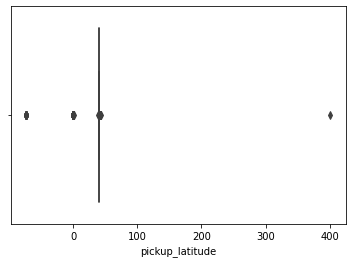

In [83]:
sns.boxplot(x=nyc["pickup_latitude"])

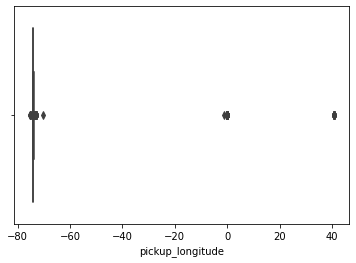

In [86]:
sns.boxplot(x=nyc["pickup_longitude"])

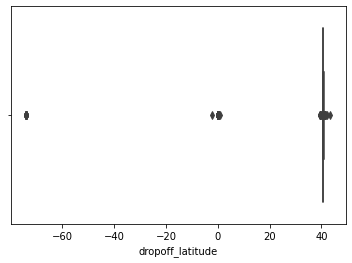

In [85]:
sns.boxplot(x=nyc["dropoff_latitude"])

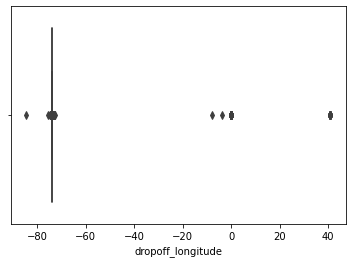

In [87]:
sns.boxplot(x=nyc["dropoff_longitude"])

In [94]:
nyc_final_filtered = nyc.query(
    'pickup_latitude > 10 \
    & pickup_latitude < 120 \
    & pickup_longitude < -60 \
    & dropoff_latitude > 10 \
    & dropoff_longitude < -60 \
    & distance <= 50').sort_values('distance', ascending=False)

# 10 < pickup_latitude < 120
# pickup_longitude < -60
# 10 < dropoff_latitude
# dropoff_longitude < -60

In [92]:
nyc_final_filtered.distance.max()

44.74698812099567

In [95]:
nyc_final_filtered

,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,distance2,distance3,distance4
33502,2014-02-22 02:44:00.00000052,136.00,2014-02-22 02:44:00 UTC,-73.989540,40.757032,-73.860580,41.147487,1,44.746988,44.746988,44.746988,44.746988
12349,2010-05-01 15:23:00.00000097,104.67,2010-05-01 15:23:00 UTC,-73.797225,40.639720,-73.840545,41.030892,1,43.648755,43.648755,43.648755,43.648755
649,2009-09-19 10:34:41.0000002,66.30,2009-09-19 10:34:41 UTC,-74.438233,40.993260,-74.185996,40.693874,2,39.476975,39.476975,39.476975,39.476975
6308,2010-08-23 11:06:00.000000121,45.00,2010-08-23 11:06:00 UTC,-73.422692,40.747012,-73.870317,40.773160,1,37.812945,37.812945,37.812945,37.812945
18656,2009-12-08 12:58:00.00000033,49.57,2009-12-08 12:58:00 UTC,-73.781842,40.644690,-74.177562,40.695237,5,33.844445,33.844445,33.844445,33.844445
...,...,...,...,...,...,...,...,...,...,...,...,...
31060,2010-10-14 19:33:00.000000253,4.90,2010-10-14 19:33:00 UTC,-73.982855,40.735333,-73.982855,40.735333,1,0.000000,0.000000,0.000000,0.000000
31041,2012-11-30 13:46:02.0000004,11.50,2012-11-30 13:46:02 UTC,-73.983847,40.738317,-73.983847,40.738317,1,0.000000,0.000000,0.000000,0.000000
31024,2010-11-28 02:45:00.000000134,14.50,2010-11-28 02:45:00 UTC,-73.896035,40.761718,-73.896035,40.761718,5,0.000000,0.000000,0.000000,0.000000
30923,2011-11-09 20:39:08.0000001,60.50,2011-11-09 20:39:08 UTC,-74.036185,40.742231,-74.036185,40.742231,1,0.000000,0.000000,0.000000,0.000000
